<a href="https://colab.research.google.com/github/kszymon/computer-vision/blob/main/01_basics/colab%20/02_intro_opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Praca z obrazami**

Notebook ma na celu przybliżenie podstawowych operacji wykonywanych na obrazie przy użyciu biblioteki OpenCV

Wykorzystamy najpopularniejszą bibliotekę do pracy przy projektach Computer Vision: [OpenCV](https://opencv.org/)


#### **Spis treści:**

1. [Instalacja i import bibliotek](#a1)
2. [Zmiana rozmiaru zdjęcia](#a2)
3. [Rotacja](#a3)
4. [Progowanie](#a4)
5. [Operacja splotu, wygładzanie](#a5)
6. [Generowanie losowego obrazu](#a6)
7. [Detekcja krawędzi](#a7)
8. [Erozja](#a8)

#### **Uwagi:**
>Aby zaktualizować bibliotekę OpenCV do aktualniej wersji należy użyć polecenia:
```
!pip install --upgrade opencv-python
```
Bądź zainstalować wybierając konkretną wersję, np.
```
!pip install opencv-python==4.1.2.30
```

### <a name='a1'></a> Instalacja i import bibliotek

In [23]:
!pip install -q --upgrade opencv-python

In [24]:
from google.colab.patches import cv2_imshow
import imutils
import numpy as np
import cv2

cv2.__version__

'4.11.0'

### <a name='a2'></a> Zmiana rozmiaru zdjęcia

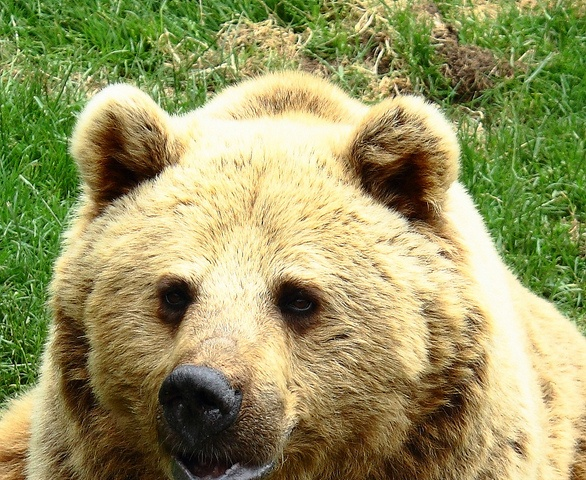

In [25]:
img = cv2.imread('bear.jpg')
cv2_imshow(img)

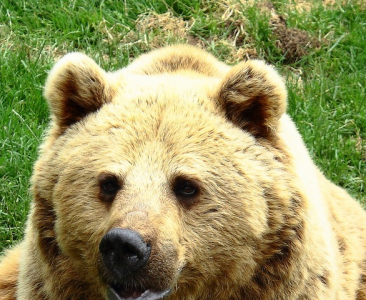

In [26]:
img_resized = imutils.resize(image=img, height=300)
cv2_imshow(img_resized)

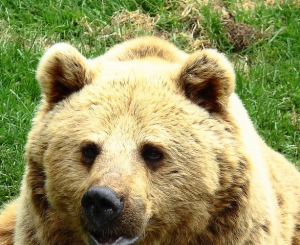

In [27]:
img_resized = imutils.resize(image=img, width=300)
cv2_imshow(img_resized)

### <a name='a3'></a> Rotacja

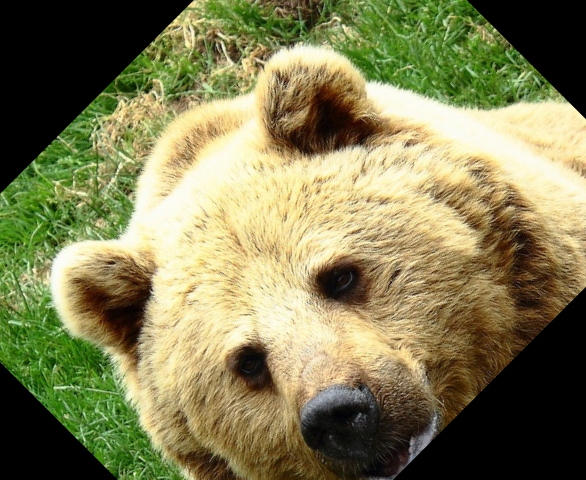

In [28]:
height, width = img.shape[:2]

M = cv2.getRotationMatrix2D(center=(width // 2, height // 2), angle=45, scale=1)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

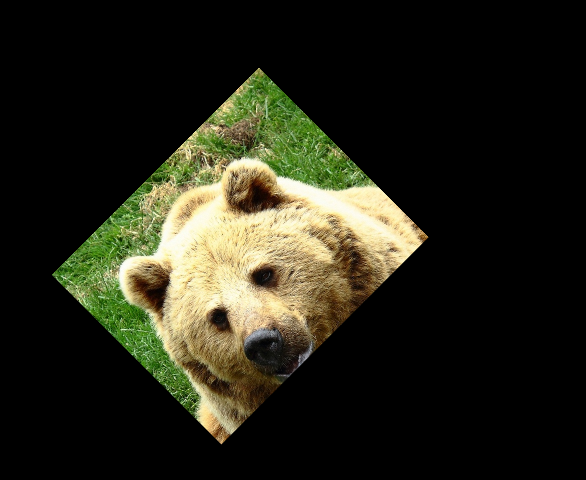

In [29]:
M = cv2.getRotationMatrix2D(center=(height // 2, width // 2), angle=45, scale=0.5)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

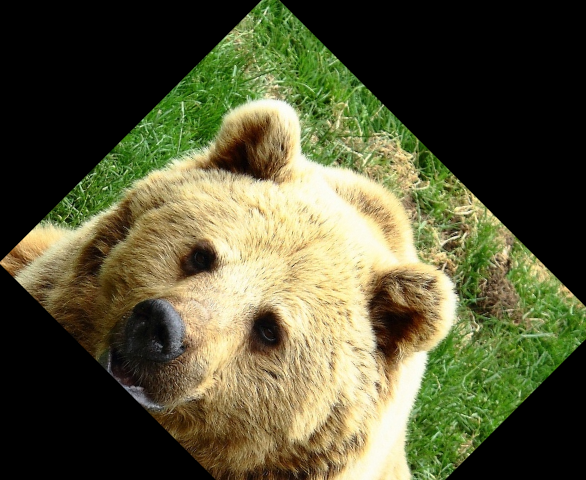

In [30]:
M = cv2.getRotationMatrix2D(center=(height // 2, width // 2), angle=-45, scale=0.8)
cv2_imshow(cv2.warpAffine(src=img, M=M, dsize=(width, height)))

### <a name='a4'></a> Progowanie

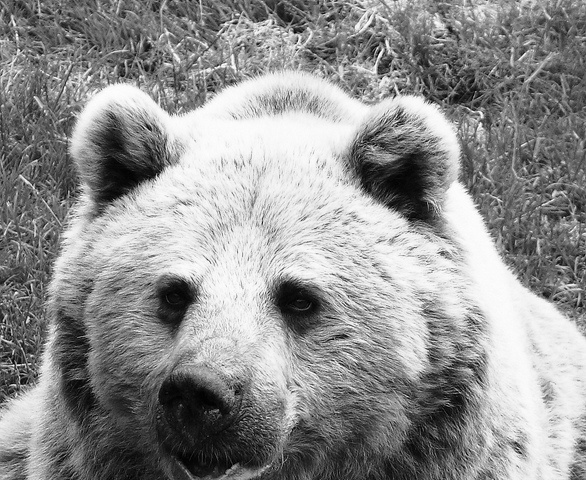

In [31]:
gray = cv2.cvtColor(src = img, code=cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

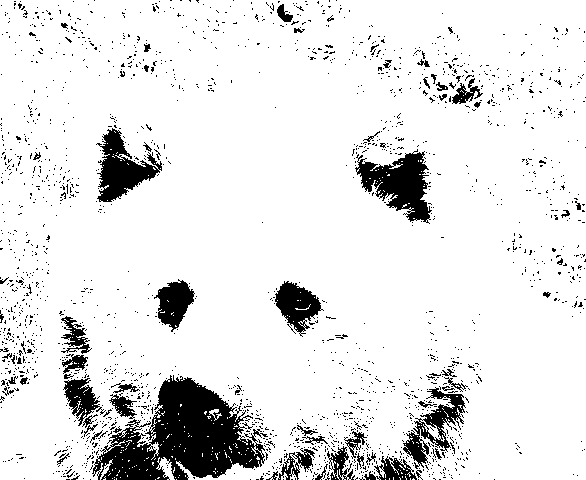

In [32]:
cv2_imshow(cv2.threshold(src=gray, thresh=50, maxval=255, type=cv2.THRESH_BINARY)[1])

### <a name='a5'></a> Operacja splotu, wygładzanie

Matematyczna operacja na macierzach, która dokonuje splotu macierzy reprezentującej obraz z inną mniejszą zwaną jądrem splotu (filtrem).

Przykładowy obraz:

|    |    |    |    |   |
|----|----|----|----|---|
| 12 | 10 | 8  | 5  | 6 |
| 3  | 1  | 4  | 4  | 5 |
| 6  | 6  | 5  | 4  | 4 |
| 12 | 10 | 11 | 11 | 9 |
| 9  | 8  | 7  | 8  | 4 |

Jądro 3x3:

|   |   |   |
|---|---|---|
| 0 | 0 | 0 |
| 0 | 1 | 0 |
| 0 | 0 | 0 |

Jądro 5x5:

|   |   |   |   |   |
|---|---|---|---|---|
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |
| 1 | 1 | 1 | 1 | 1 |

Poprzez zwiększenie rozmiaru jądra uśreniamy wartość piksela na większym obszarze przez co w przypadku rozmawywania dostajemy mocniejszy efekt.

In [33]:
kernel = np.ones(shape=(5,5), dtype=np.float32) / 25
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

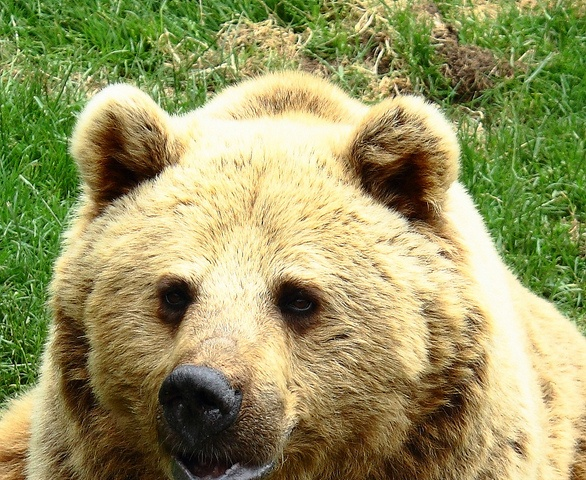

In [34]:
cv2_imshow(img)

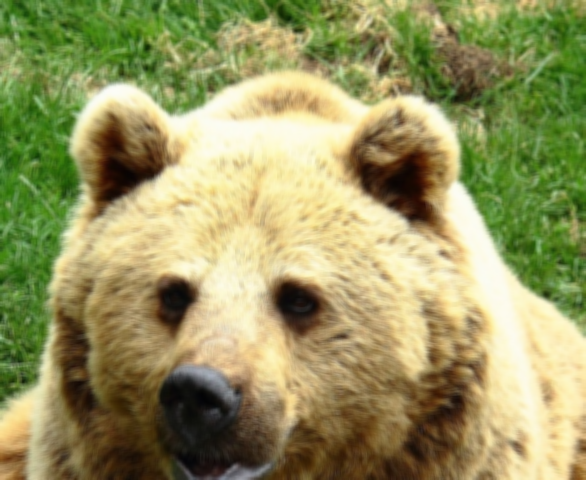

In [35]:
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

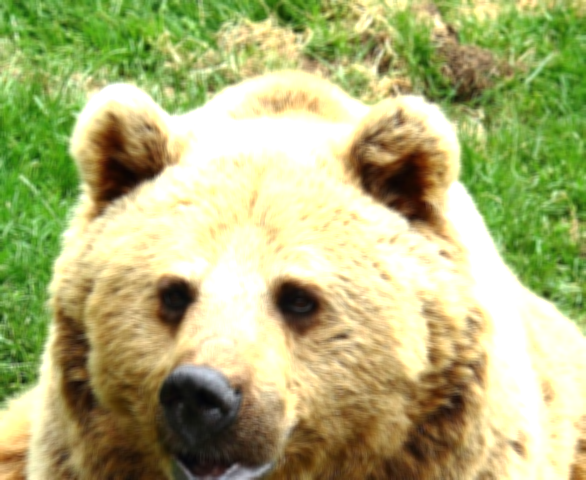

In [36]:
kernel = np.ones((5, 5), np.float32) / 20
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

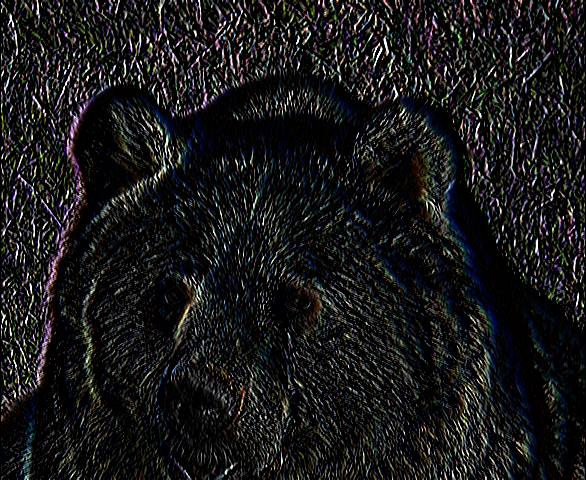

In [37]:
kernel = np.array([[-1, 0, 1],
                   [-1, 0, 1],
                   [-1, 0, 1]])
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

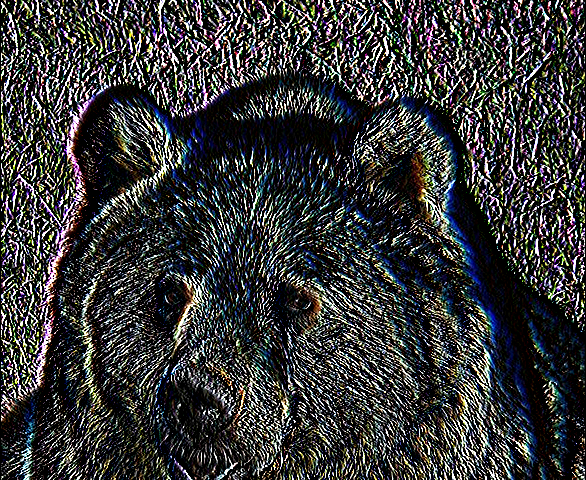

In [38]:
kernel = np.array([[-1, 0, 1],
                   [-5, 0, 5],
                   [-1, 0, 1]])
cv2_imshow(cv2.filter2D(src=img, ddepth=-1, kernel=kernel))

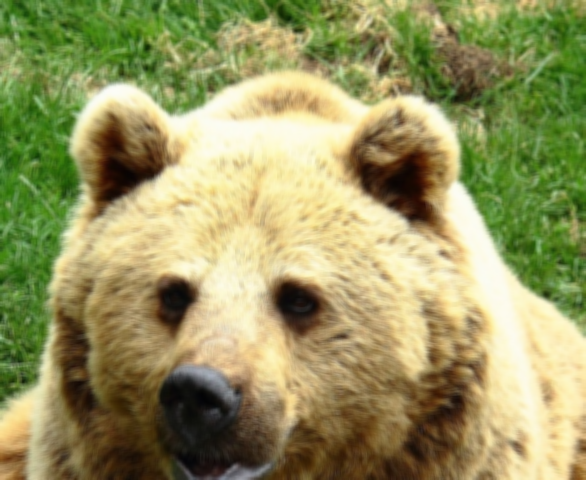

In [39]:
cv2_imshow(cv2.blur(src=img, ksize=(5, 5)))

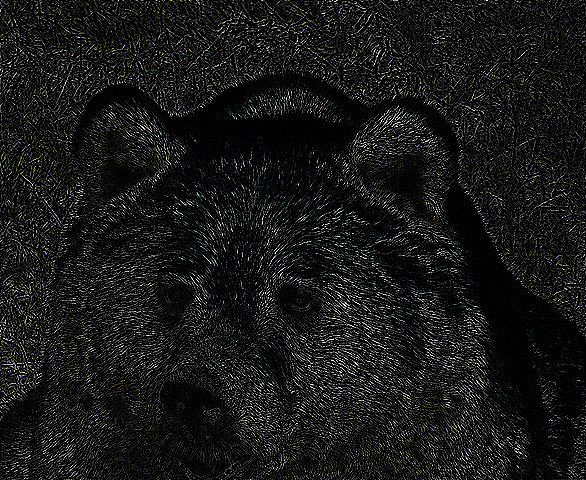

In [40]:
cv2_imshow(cv2.Laplacian(src=img, ddepth=cv2.CV_64F))

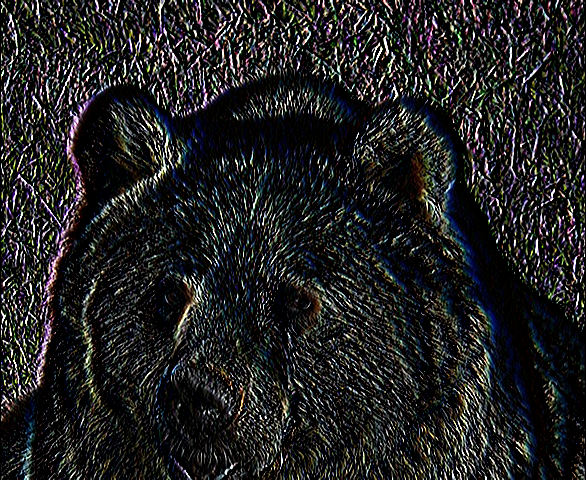

In [41]:
cv2_imshow(cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=0))

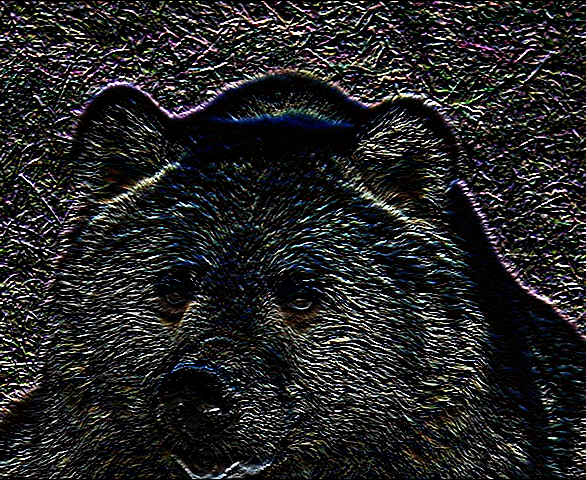

In [42]:
cv2_imshow(cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1))

### <a name='a6'></a> Generowanie losowego obrazu


In [45]:
# w skali szarości
array = np.random.randint(low=0, high=256, size=(400, 500))
array

array([[173, 148, 207, ...,  16,  49,  12],
       [223, 117, 129, ..., 203, 177, 141],
       [ 65,  26,  53, ..., 132, 218,   9],
       ...,
       [129, 245,   1, ..., 178,  30,  28],
       [ 31, 236, 139, ..., 189,  31, 196],
       [200, 244, 151, ..., 171,  36, 243]])

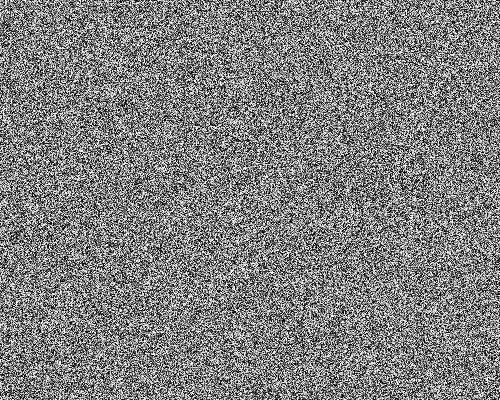

In [46]:
cv2_imshow(array)

In [48]:
# kolorowy
array = np.random.randint(low=0, high=256, size=(400, 500, 4))
array

array([[[209,  21,  24, 181],
        [193,  58, 136, 214],
        [ 55,  42,  69, 177],
        ...,
        [ 54,  83,  22, 181],
        [161,  96, 130, 113],
        [ 62, 209,  97, 195]],

       [[163,  49, 174, 111],
        [ 34,  86, 108, 220],
        [184, 165,  79, 159],
        ...,
        [  9, 114, 176, 160],
        [230, 250, 124, 242],
        [ 91, 222, 240, 143]],

       [[169, 189, 166,  94],
        [184, 245, 183, 147],
        [109,  15,  49, 172],
        ...,
        [149,   1, 199, 224],
        [ 23, 158,  42,  23],
        [157, 212,  73, 146]],

       ...,

       [[ 29,  68,  68, 166],
        [ 57, 212, 172,  99],
        [213, 150, 202, 155],
        ...,
        [ 60,  39, 138,  11],
        [ 23, 252,  55,  47],
        [ 96, 143,  58, 221]],

       [[ 74,  46,  49, 215],
        [102,  37, 212,  65],
        [124, 142,  97, 142],
        ...,
        [ 36, 124, 108, 186],
        [167, 254,  23,  82],
        [211, 221,   1, 190]],

       [[ 13

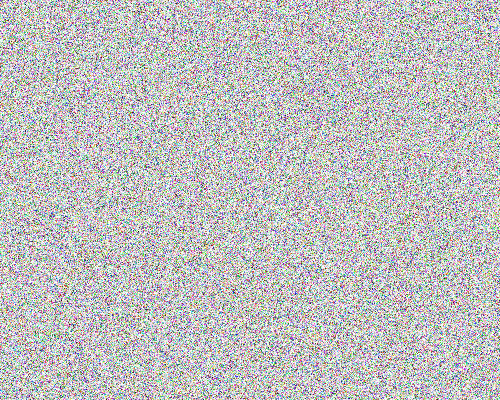

In [49]:
cv2_imshow(array)

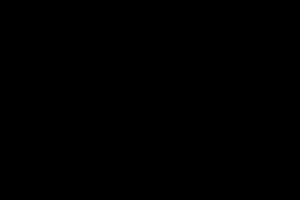

In [50]:
array = np.zeros(shape=(200, 300))
cv2_imshow(array)

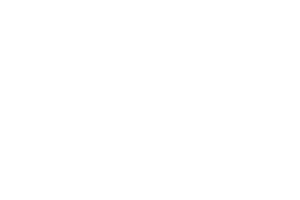

In [51]:
array = np.full(shape=(200, 300), fill_value=255)
cv2_imshow(array)

### <a name='a7'></a> Detekcja krawędzi

Filtr krawędzi pionowych

|    |   |   |
|----|---|---|
| -1 | 0 | 1 |
| -2 | 0 | 2 |
| -1 | 0 | 1 |

Filtr krawędzi poziomych

|    |    |    |
|----|----|----|
| -1 | -2 | -1 |
| 0  | 0  | 0  |
| 1  | 2  | 1  |

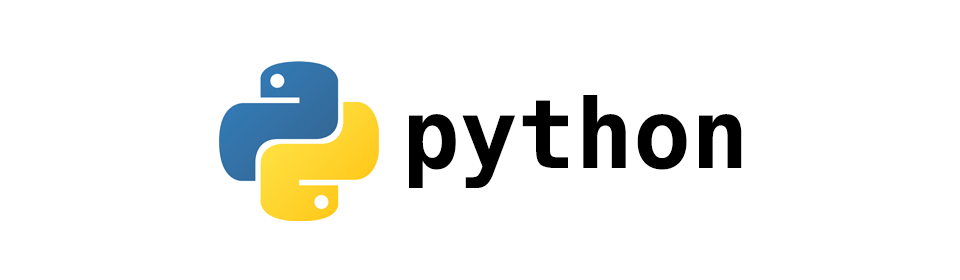

In [52]:
logo = cv2.imread('python.png')
cv2_imshow(logo)

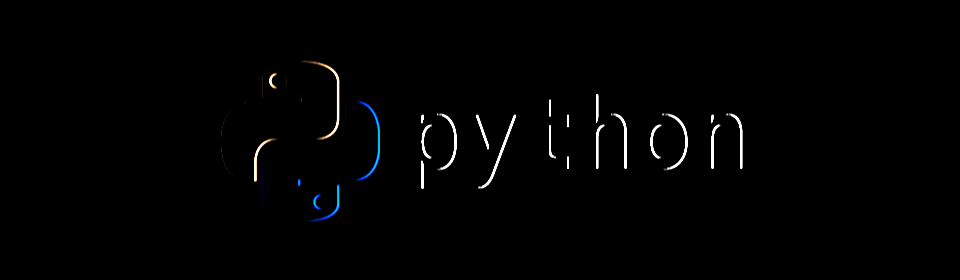

In [53]:
kernel_vertical = np.array([[-1, 0 , 1], [-2, 0, 2], [-1, 0, 1]])
output = cv2.filter2D(src=logo, ddepth = -1, kernel=kernel_vertical)
cv2_imshow(output)

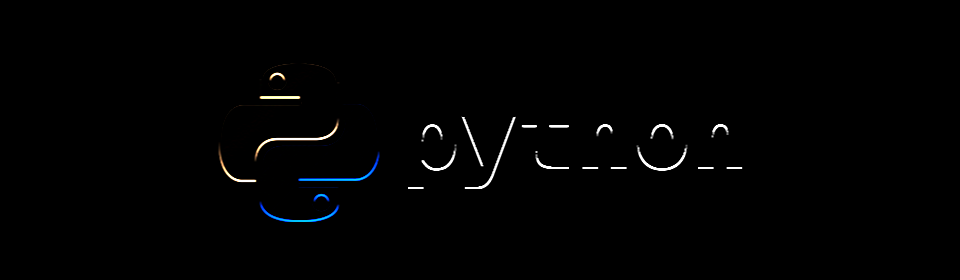

In [54]:
kernel_horizontal = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
output = cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_horizontal)
cv2_imshow(output)

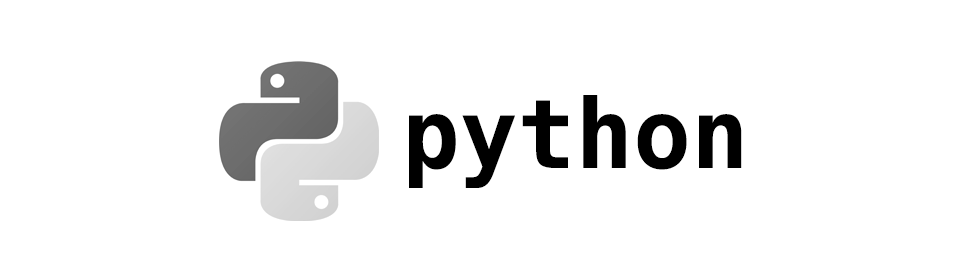

In [56]:
logo = cv2.imread('python.png', flags=cv2.IMREAD_GRAYSCALE)
cv2_imshow(logo)

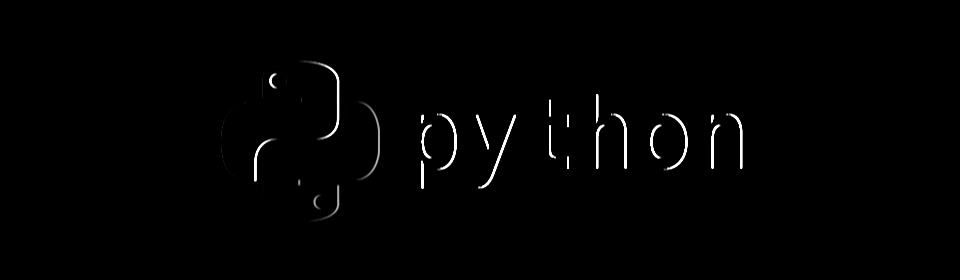

In [57]:
cv2_imshow(cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_vertical))

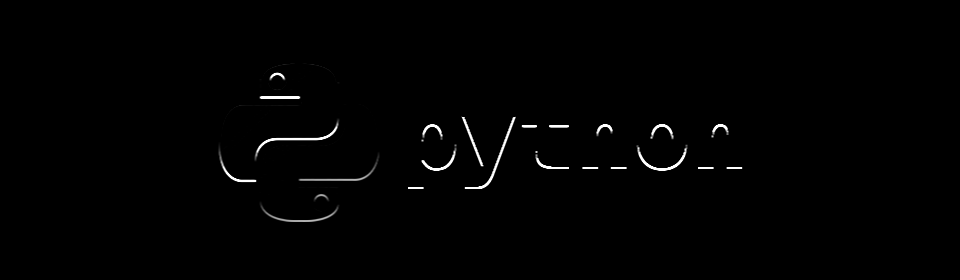

In [58]:
cv2_imshow(cv2.filter2D(src=logo, ddepth=-1, kernel=kernel_horizontal))

Filtry, którymi się posługujemy są znane pod nazwą Sobel. Bilioteka OpenCV dostarcza także gotową funkcję Sobel.

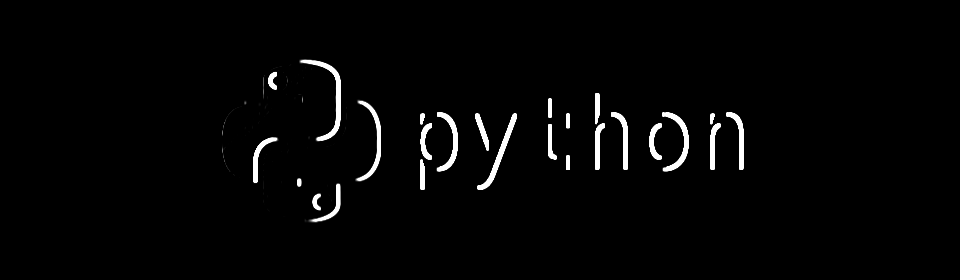

In [59]:
cv2_imshow(cv2.Sobel(src=logo, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5))

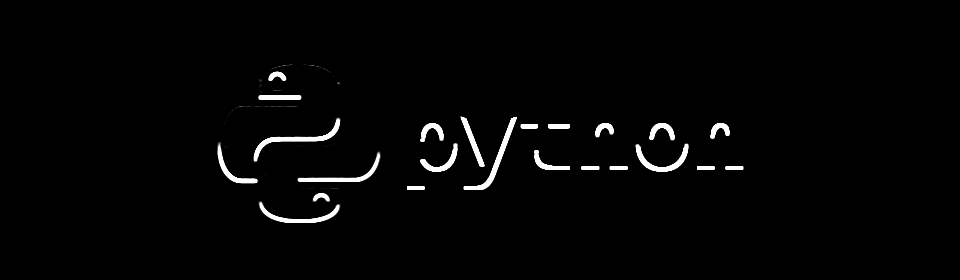

In [60]:
cv2_imshow(cv2.Sobel(src=logo, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5))

Innym znanym filterm, który pozwala wykrywać krawędzie jest Laplacian.

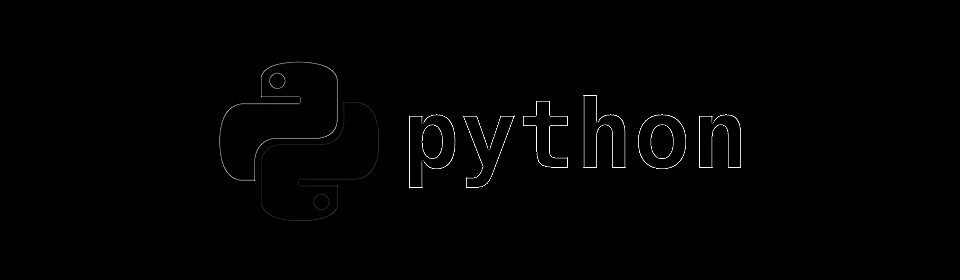

In [61]:
cv2_imshow(cv2.Laplacian(src=logo, ddepth=cv2.CV_64F))

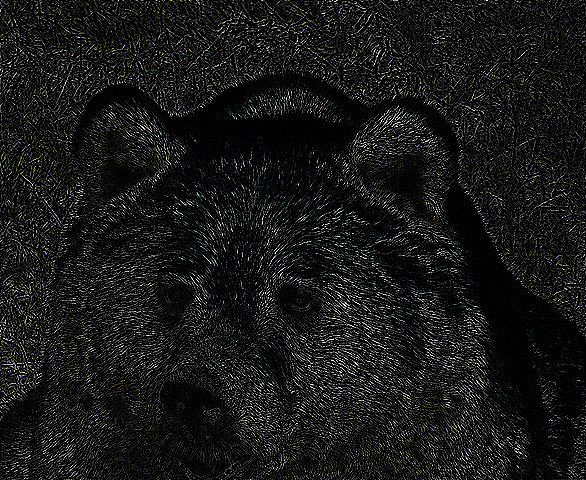

In [62]:
view = cv2.imread('bear.jpg')
cv2_imshow(cv2.Laplacian(src=view, ddepth=cv2.CV_64F))

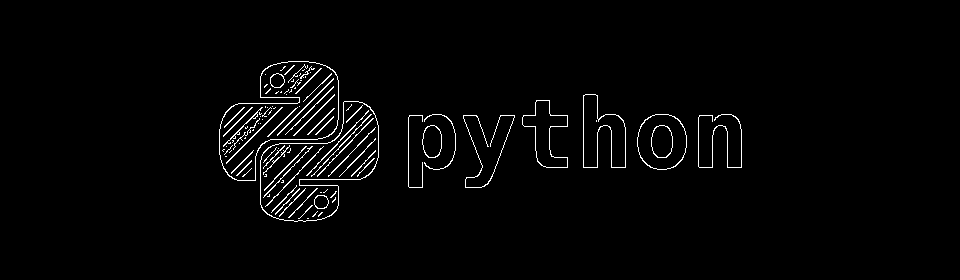

In [63]:
cv2_imshow(cv2.Canny(image=logo, threshold1=0, threshold2=0))

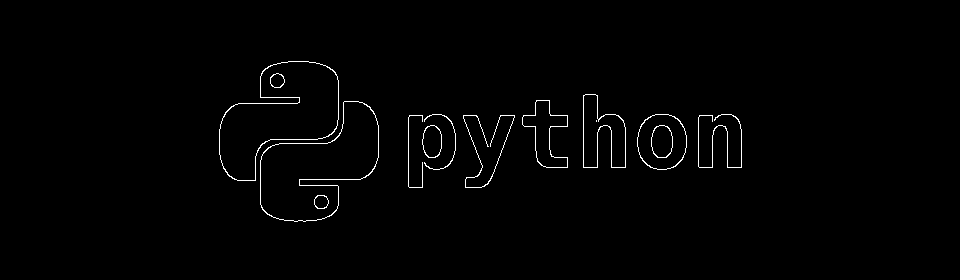

In [64]:
cv2_imshow(cv2.Canny(image=logo, threshold1=100, threshold2=100))

### <a name='a8'></a> Erozja

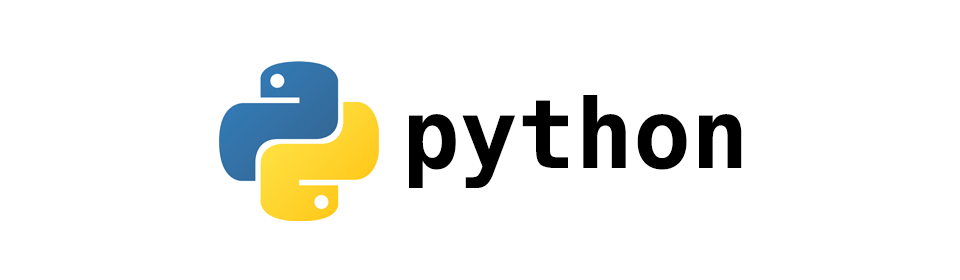

In [65]:
logo = cv2.imread('python.png')
cv2_imshow(logo)

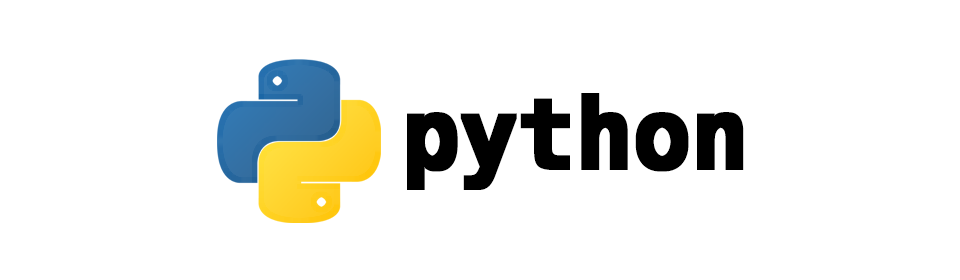

In [68]:
kernel = np.ones((5, 5), np.uint8)
cv2_imshow(cv2.erode(src=logo, kernel=kernel, iterations=1))

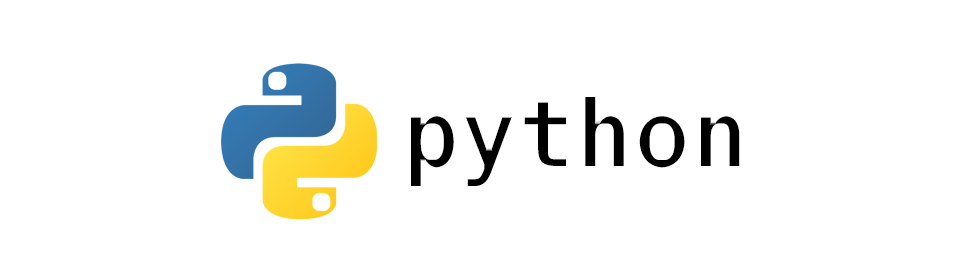

In [69]:
cv2_imshow(cv2.dilate(src=logo, kernel=kernel, iterations=1))